<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Загрузим-данные-и-изучим-общую-информацию." data-toc-modified-id="Загрузим-данные-и-изучим-общую-информацию.-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Загрузим данные и изучим общую информацию.</a></span></li><li><span><a href="#Предобработка-данных,-продолжаем-изучать-данные" data-toc-modified-id="Предобработка-данных,-продолжаем-изучать-данные-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка данных, продолжаем изучать данные</a></span></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Анализ данных</a></span></li><li><span><a href="#Детализируем-исследование:-открытие-кофейни" data-toc-modified-id="Детализируем-исследование:-открытие-кофейни-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Детализируем исследование: открытие кофейни</a></span></li><li><span><a href="#Общий-вывод" data-toc-modified-id="Общий-вывод-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Общий вывод</a></span></li></ul></div>

# Рынок заведений общественного питания Москвы

Инвесторы решили попробовать себя в новой области и открыть заведение общественного питания в Москве.  
Для начала они  просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.  
Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import plotly.express as px
from folium import Map, Marker, Choropleth
import folium
from folium.plugins import MarkerCluster
import json
sns.set_style("darkgrid")

In [2]:
pd.set_option('display.max_colwidth', None)

### Загрузим данные и изучим общую информацию.

In [3]:
df = pd.read_csv('csv/moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
##df.to_csv('logs_exp.csv', index=False) 

**Описание данных**

`name` — название заведения;  
`address` — адрес заведения;  
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
`hours` — информация о днях и часах работы;  
`lat` — широта географической точки, в которой находится заведение;  
`lng` — долгота географической точки, в которой находится заведение;  
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
- «Средний счёт: 1000–1500 ₽»;  
- «Цена чашки капучино: 130–220 ₽»;  
- «Цена бокала пива: 400–600 ₽».  
   и так далее;

`middle_avg_bil`l — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с      подстроки «Средний счёт»:  
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:  
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

`district` — административный округ, в котором находится заведение, например Центральный административный округ;  
`seats` — количество посадочных мест.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
(df.isna().agg(['sum', 'mean'])
    .style.set_caption('Количество пропусков')
    .set_table_styles([{'selector': 'caption', 
                     'props': [('color', 'black'), ('font-size', '15px')]
                     }]))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
sum,0.000000,0.000000,0.000000,0.000000,536.000000,0.000000,0.000000,0.000000,5091.000000,4590.000000,5257.000000,7871.000000,0.000000,3611.000000
mean,0.000000,0.000000,0.000000,0.000000,0.063764,0.000000,0.000000,0.000000,0.605639,0.546039,0.625387,0.936355,0.000000,0.429574


In [7]:
print('Количество уникальных значений в каждой колонке:')
for index in df.columns:
    row = df[index].nunique()
    print(f'Уникальный значений {index}: {row}')

Количество уникальных значений в каждой колонке:
Уникальный значений name: 5614
Уникальный значений category: 8
Уникальный значений address: 5753
Уникальный значений district: 9
Уникальный значений hours: 1307
Уникальный значений lat: 8209
Уникальный значений lng: 8258
Уникальный значений rating: 41
Уникальный значений price: 4
Уникальный значений avg_bill: 897
Уникальный значений middle_avg_bill: 230
Уникальный значений middle_coffee_cup: 96
Уникальный значений chain: 2
Уникальный значений seats: 229


Посомтрим какие категорий заведений у нас есть

In [8]:
df['category'].value_counts(normalize=True, ascending=False).to_frame().style.background_gradient(
    cmap='Blues').set_precision(3)

,category
кафе,0.283
ресторан,0.243
кофейня,0.168
"бар,паб",0.091
пиццерия,0.075
быстрое питание,0.072
столовая,0.037
булочная,0.030


Большего всего в Москве кафе, далее идут рестораны и кофейни, меньше всего булочных.  
Посмотрим в каких ценовых категориях представлены заведения

In [9]:
df['price'].value_counts(normalize=True, ascending=False)\
    .to_frame().style.background_gradient(cmap='Blues').set_precision(3) 

,price
средние,0.639
выше среднего,0.170
высокие,0.144
низкие,0.047


In [10]:
df['price'].value_counts(normalize=True, ascending=False, dropna=False)\
    .to_frame().style.background_gradient(cmap='Blues').set_precision(3) 

,price
nan,0.606
средние,0.252
выше среднего,0.067
высокие,0.057
низкие,0.019


У 60% нет данных о прайсе.  
В каких административных округах расположены заведения

In [11]:
df['district'].value_counts(normalize=True, ascending=False)\
    .to_frame().style.background_gradient(cmap='Blues').set_precision(3) 

,district
Центральный административный округ,0.267
Северный административный округ,0.107
Южный административный округ,0.106
Северо-Восточный административный округ,0.106
Западный административный округ,0.101
Восточный административный округ,0.095
Юго-Восточный административный округ,0.085
Юго-Западный административный округ,0.084
Северо-Западный административный округ,0.049


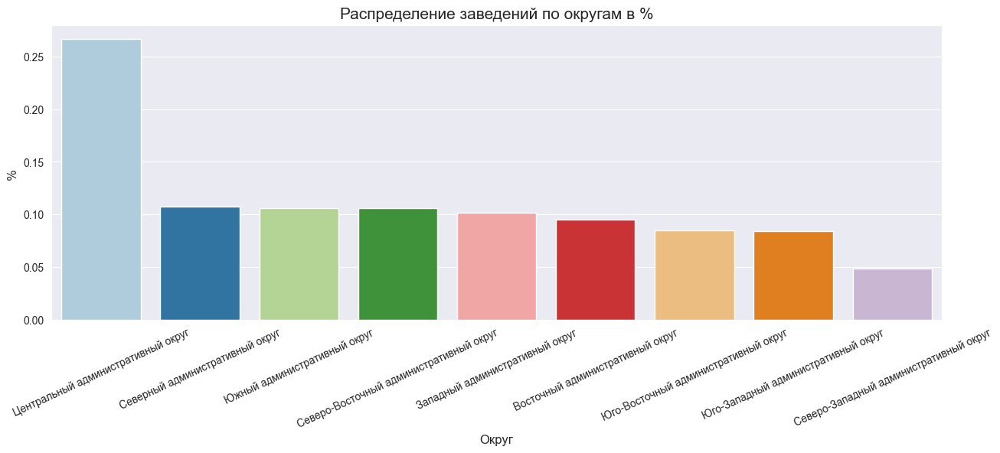

In [12]:
t = df['district'].value_counts(normalize=True, ascending=False)

plt.figure(figsize=(15,5))
ax = sns.barplot(x=t.index, y=t.values,  palette='Paired')
ax.set_xlabel('Округ',fontsize=12)
ax.set_ylabel('% ', fontsize=12)
ax.set_title('Распределение заведений по округам в %', fontsize=15)
plt.xticks(rotation = 25)
plt.show()

В центральный административный округе в два с половиной раза больше заведений чем в других.  
Меньше всего в Северо-Западный административный округ на его долю приходится 5%

Посомтрим долю сетевых заведений

In [13]:
df['chain'].value_counts(normalize=True, ascending=False) 

0    0.618725
1    0.381275
Name: chain, dtype: float64

60% заведений не являются сетевыми

In [14]:
(df[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].describe()
     .style.set_caption('Сводная статистика')
    .set_table_styles([{'selector': 'caption', 
                     'props': [('color', 'black'), ('font-size', '15px')]
                     }]))

,rating,middle_avg_bill,middle_coffee_cup,seats
count,8406.000000,3149.000000,535.000000,4795.000000
mean,4.229895,958.053668,174.721495,108.421689
std,0.470348,1009.732845,88.951103,122.833396
min,1.000000,0.000000,60.000000,0.000000
25%,4.100000,375.000000,124.500000,40.000000
50%,4.300000,750.000000,169.000000,75.000000
75%,4.400000,1250.000000,225.000000,140.000000
max,5.000000,35000.000000,1568.000000,1288.000000


Если с рейтингом все понятно, бывает от 1 до 5, то по остальным столбцам очень большой размах

**Вывод:**  
У нас есть датафрейм с 14 колонками и 8406 строками.  
5201 уникальных заведений и 3205 сетевых.  
Прилично пропусков в столбах касающихся прайса меню и количестве посадочных мест.
Пропуски возможно связаны с тем, что владельцы не указали информацию в сервисе Яндекс Бизнес или Яндекс картах.
Позже подумаем, что с ними делать, но скорее всего оставим как есть.    
У 60% заведений не указана цена, из оставшихся 40% около 64 процентов это заведения `средней` ценовой категории, порядка 30% приходится на `выше среднего` и `высокие` и только 5% `дешевых` .    
40 процентов приходится на сетевые заведения

### Предобработка данных, продолжаем изучать данные

Проверим на дубликаты

In [15]:
df.duplicated().sum()

0

Явных дубликатов нет, посмотрим по адресу и названию,  
Сначала приведем все к нижнему регистру, удалим пробелы в начале и конце, `Ё` заменим на `Е` .   

In [16]:
df['name'].nunique()

5614

In [17]:
df['name'] = df['name'].str.lower()
df['name'] = df['name'].str.strip()
df['name'] = df['name'].str.replace('ё', 'е')

In [18]:
df['name'].nunique()

5506

In [19]:
df['address'].nunique()

5753

In [20]:
df['address'] = df['address'].str.lower()
df['address'] = df['address'].str.strip()
df['address'] = df['address'].str.replace('ё', 'е')

In [21]:
df['address'].nunique()

5752

In [22]:
df[df[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Есть 4 заведения у которых совпадает название и адрес, но дубликатом тут можно считать только 	`more poke` .    
Оставим обе записи, сильно картину они не изменят. Пробежимся глазами вдруг есть опечатки в названии заведения.

In [23]:
df['name'].value_counts().iloc[:10]

кафе                189
шоколадница         120
домино'с пицца       77
додо пицца           74
one price coffee     72
яндекс лавка         69
cofix                65
prime                50
хинкальная           44
шаурма               43
Name: name, dtype: int64

In [24]:
df['name'].value_counts(ascending=True).iloc[:15]

i-chef                       1
время чудес                  1
vip wok & sushi              1
обжора                       1
фитнес кафе                  1
блинотека - блины и вафли    1
рецептор                     1
карамзин                     1
заяц и шляпа                 1
буфалино                     1
bbq point                    1
кафе пекарня                 1
чела                         1
самсахона                    1
кулинария виктория           1
Name: name, dtype: int64

In [25]:
df[df['chain'] == 1]['name'].value_counts(ascending=True).iloc[:10]

суши wok           1
home               1
роллофф            1
пекарня № 1        1
1-я креветочная    1
парк               1
мореморе           1
kimpab             1
бюро пиццы         1
tasty thai         1
Name: name, dtype: int64

Визуально опечаток нет.  
Создадим столбец street с названиями улиц из столбца с адресом.

In [26]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия', 'километр', 'просек', 'мост', 'бульвар', 'проезд']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

df["street"] = df["address"].str.extract(str_pat)

In [27]:
df.sample(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
6686,vietday,кафе,"москва, профсоюзная улица, 126к3",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.630593,37.517070,4.4,NaN,NaN,NaN,NaN,0,NaN,профсоюзная улица
5813,блеск,кафе,"москва, дорогобужская улица, 14с9",Западный административный округ,пн-пт 11:30–17:00,55.712371,37.415263,4.3,NaN,NaN,NaN,NaN,0,NaN,дорогобужская улица


In [28]:
df['street'].isna().sum()

155

155 пропусков, посомтрим из за чего они получились

In [29]:
df[df['street'].isna()].iloc[:5]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,NaN
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,NaN
64,testo мания,кофейня,"москва, лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN
73,веранда,ресторан,"москва, парк алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,NaN
137,get and fly,ресторан,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880350,37.530713,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN


Часть зведений находится в парках и заказниках, так и укажем в столбце `street`

In [30]:
df.loc[df['street'].isna() & df['address'].str.contains('парк'), 'street'] = 'находится в парке'
df.loc[df['street'].isna() & df['address'].str.contains('заказник'), 'street'] = 'находится в заказнике'

In [31]:
print(f'Осталось {df["street"].isna().sum()} пропуска, заполним, что нет улицы')

Осталось 92 пропуска, заполним, что нет улицы


In [32]:
df['street'] = df['street'].fillna('нет улицы')

Создадим столбец с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [33]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

У 536 завдений не указан режим работы, заполним нет данных 

In [34]:
df['is_24/7'] = df['is_24/7'].fillna('нет данных')

**Вывод:**
Привели ячейки в порядок, не нашли явных дубликатов а данных нет, добавили два новых столбца

### Анализ данных

Посмотрим какие категории заведений представлены.

In [35]:
df['category'].value_counts(normalize=True, ascending=False).to_frame()

,category
кафе,0.282893
ресторан,0.243041
кофейня,0.168094
"бар,паб",0.091006
пиццерия,0.075303
быстрое питание,0.071734
столовая,0.037473
булочная,0.030454


Построим для наглядности график

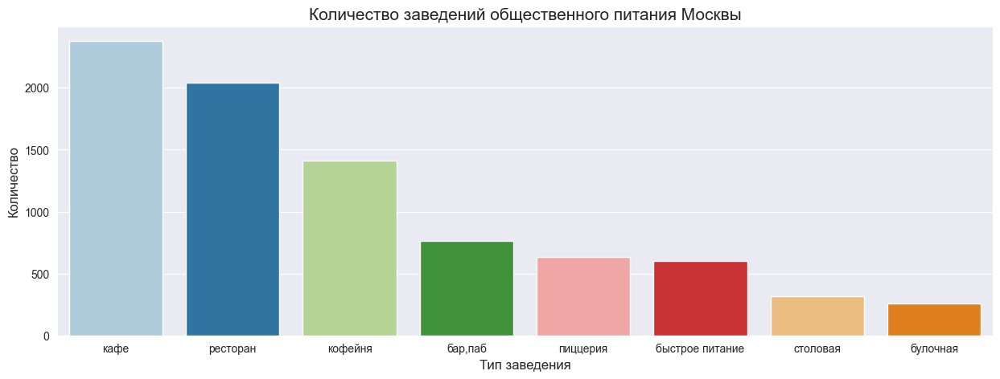

In [36]:
t = df['category'].value_counts(ascending=False)

plt.figure(figsize=(15,5))
g = sns.barplot(x=t.index, y=t.values,  palette='Paired')
g.set_xlabel('Тип заведения',fontsize=12)
g.set_ylabel('Количество', fontsize=12)
g.set_title('Количество заведений общественного питания Москвы', fontsize=15)
plt.show()

Большего всего в Москве кафе, далее идут рестораны и кофейни, меньше всего булочных.  
Посмотрим на количество посадочных мест. Для начали проанализируем для каких категорий заведений больше всего пропусков, далее посмотрим на распределение количества мест по категориям где данные указаны.

In [37]:
df[df['seats'].isna()]['category'].value_counts(normalize=True, ascending=False)

кафе               0.321241
ресторан           0.214068
кофейня            0.183329
бар,паб            0.082249
быстрое питание    0.070341
пиццерия           0.057048
столовая           0.041817
булочная           0.029909
Name: category, dtype: float64

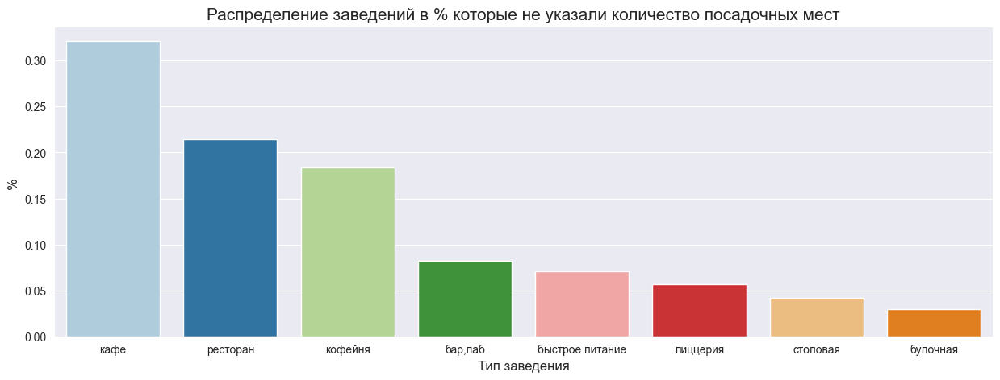

In [38]:
t = df[df['seats'].isna()]['category'].value_counts(normalize=True, ascending=False)

plt.figure(figsize=(15,5))
g = sns.barplot(x=t.index, y=t.values,  palette='Paired')
g.set_xlabel('Тип заведения',fontsize=12)
g.set_ylabel('% ', fontsize=12)
g.set_title('Распределение заведений в % которые не указали количество посадочных мест', fontsize=15)
plt.show()

Странно, почти каждое 3-е кафе и каждый 5 ресторан и кофейня не указывают количество посадочных мест.

Посмотрим на распределение посадочных мест в общем 

Среднее значение: 108.42
Медианное значение: 75.0
Минимальное значение: 0.0
Максимальное значение: 1288.0


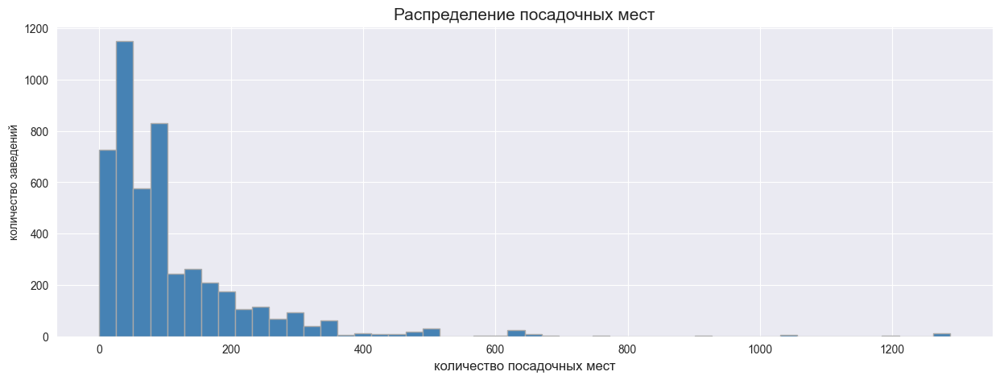

In [39]:
df['seats'].hist(bins=50, color='steelblue',figsize=(15, 5), ec="darkgrey")
print(f"Среднее значение: {df['seats'].mean().round(2)}")
print(f"Медианное значение: {df['seats'].median().round(2)}")
print(f"Минимальное значение: {df['seats'].min().round(2)}")
print(f"Максимальное значение: {df['seats'].max().round(2)}")
plt.title('Распределение посадочных мест', fontsize=15) 
plt.xlabel('количество посадочных мест', fontsize=12) 
plt.ylabel('количество заведений', fontsize=10) 
plt.show() 

Уберем выбросы (5% мест), посомтрим как изменится график

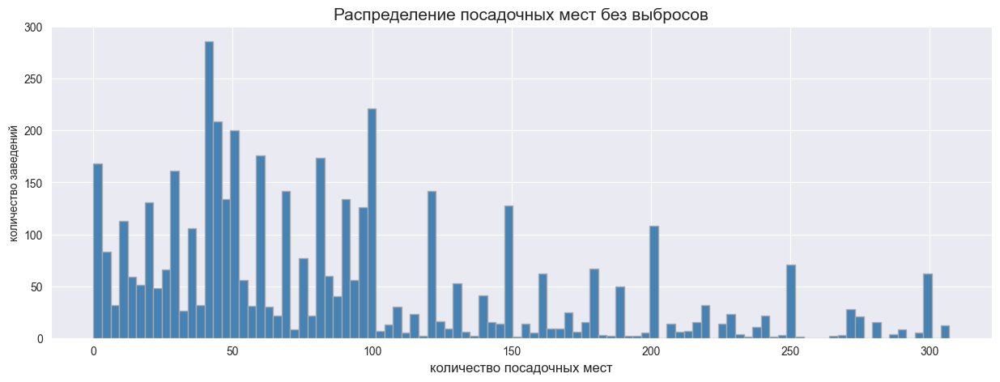

In [40]:
df['seats'].hist(bins=100, range=(0, df['seats'].quantile(0.95)), color='steelblue',figsize=(15, 5), ec="darkgrey")
plt.title('Распределение посадочных мест без выбросов', fontsize=15) 
plt.xlabel('количество посадочных мест', fontsize=12) 
plt.ylabel('количество заведений', fontsize=10) 
plt.show() 

In [41]:
print(f"Количество заведений с более 800 посадочных мест {df[df['seats'] > 800]['category'].count()}")

Количество заведений с более 800 посадочных мест 18


In [42]:
print(f"Процент заведений с более 200 посадочных мест {((df[df['seats'] > 200]['category'].count() / df['category'].count()) * 100).round(2)}") 

Процент заведений с более 200 посадочных мест 7.46


In [43]:
df['seats'].value_counts().iloc[:5].to_frame()

,seats
40.0,253
100.0,213
60.0,175
50.0,168
80.0,160


Всего у 18 заведений больше 800 посадочных мест и у 7,5% больше 200.  
В основном же в Москве заведения располагают до 100 посадочных мест. Топ 5 - 40, 100, 60, 50, 80.  
Давайте посмотрим на распределение количества мест по категориям

In [44]:
t = df.groupby('category')['seats'].agg(['mean', 'median', 'max', 'count']).round(2).reset_index().sort_values(by='mean')
t

,category,mean,median,max,count
1,булочная,89.39,50.0,625.0,148
5,пиццерия,94.50,55.0,1288.0,427
3,кафе,97.51,60.0,1288.0,1218
2,быстрое питание,98.89,65.0,1040.0,349
7,столовая,99.75,75.5,1200.0,164
4,кофейня,111.20,80.0,1288.0,751
6,ресторан,121.94,86.0,1288.0,1270
0,"бар,паб",124.53,82.5,1288.0,468


Распределение скошено вправо. Среднее значение больше медианы, наблюдается длинный хвост.  

У 5 категорий из 8 максимальное значение посадочных мест 1288, давайте посмотрим сколько таких заведений и где они находятся.

In [45]:
df[df['seats'] == 1288.0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0,проспект вернадского,True
6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0,проспект вернадского,False
6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0,проспект вернадского,False
6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0,проспект вернадского,False
6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0,проспект вернадского,False
6684,пивной ресторан,"бар,паб","москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288.0,проспект вернадского,нет данных
6690,японская кухня,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288.0,проспект вернадского,нет данных
6771,точка,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,NaN,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0,проспект вернадского,нет данных
6807,loft-cafe академия,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0,проспект вернадского,False
6808,яндекс лавка,ресторан,"москва, проспект вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288.0,проспект вернадского,True


Странно, что все они на одной улице, думаю тут какая-то ошибка, предлагаю посмотреть на распределение посадочных мест убрать 5% выбросов, это поможет нам построить более реалистичную модель.  
Построим два графика по `среднему` и `медиане`

In [46]:
number_seats = df[df['seats'] < df['seats'].quantile(0.95)]
number_seats = (number_seats.groupby('category')['seats']
         .agg(['mean', 'median', 'max', 'count']).round(2).reset_index().sort_values(by='mean'))
number_seats

,category,mean,median,max,count
3,кафе,78.55,56.0,306.0,1163
5,пиццерия,79.01,50.0,300.0,410
1,булочная,79.76,48.5,300.0,144
7,столовая,81.38,72.0,300.0,157
2,быстрое питание,85.74,60.0,306.0,335
4,кофейня,89.96,70.0,306.0,712
0,"бар,паб",94.82,80.0,306.0,436
6,ресторан,99.89,80.0,306.0,1196


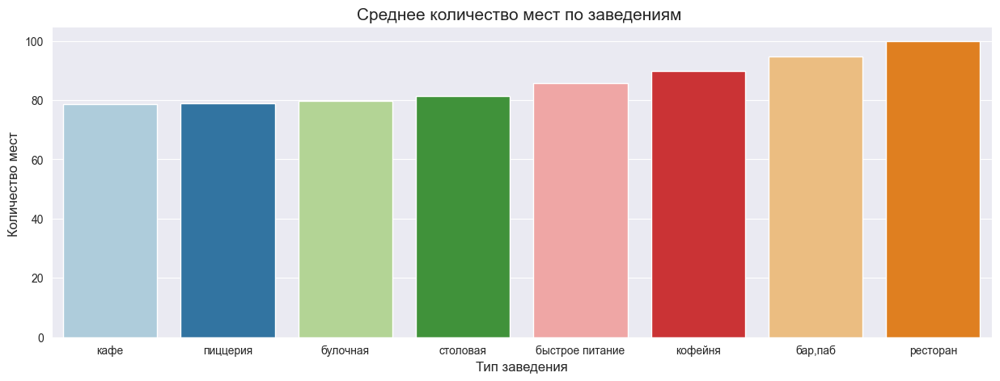

In [47]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x=number_seats['category'], 
                 y=number_seats['mean'], 
                 data = number_seats,
                 palette='Paired')
ax.set_xlabel('Тип заведения',fontsize=12)
ax.set_ylabel('Количество мест ', fontsize=12)
ax.set_title('Среднее количество мест по заведениям ', fontsize=15)
plt.show()

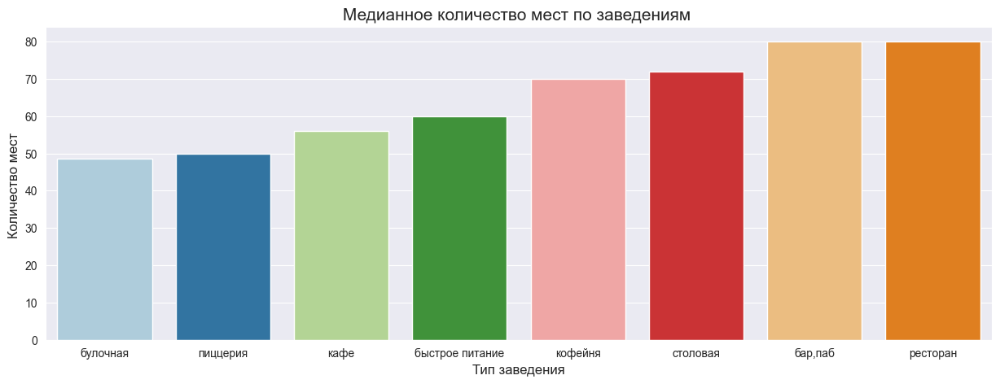

In [48]:
number_seats = number_seats.sort_values(by='median')
plt.figure(figsize=(15,5))
g = sns.barplot(x=number_seats['category'], y=number_seats['median'], palette='Paired')
g.set_xlabel('Тип заведения',fontsize=12)
g.set_ylabel('Количество мест ', fontsize=12)
g.set_title('Медианное количество мест по заведениям ', fontsize=15)
plt.show()

Ожидаем в ресторанах и барах посадочных мест больше, чем в других категориях

Посмотрим на распределение сетевых и несетевых заведений в Москве

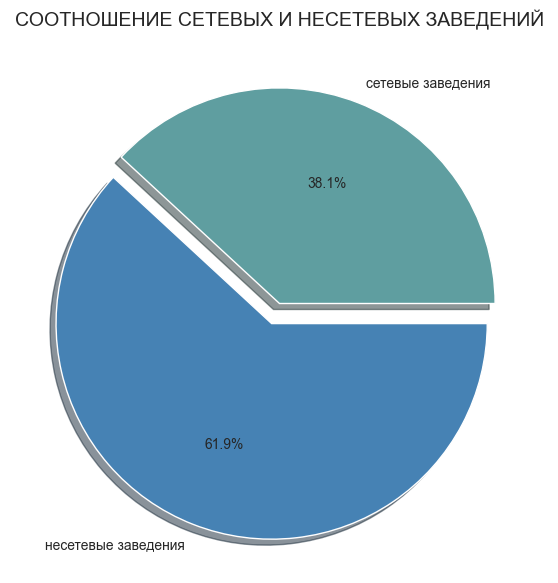

In [49]:
df_chain = df.groupby('chain').agg(count=('name','count')).reset_index()
plt.figure(figsize=(7, 7))


plt.pie(df_chain['count'],
        labels=df_chain['chain'].map({True: 'сетевые заведения', False: 'несетевые заведения'}), 
        colors=['steelblue', 'cadetblue'],
        explode = (0.1, 0), 
        autopct='%1.1f%%',
        counterclock=False, 
        shadow=True)
plt.title('СООТНОШЕНИЕ СЕТЕВЫХ И НЕСЕТЕВЫХ ЗАВЕДЕНИЙ',fontsize=14)
plt.show()

Около 40% заведений в Москве являются сетевыми.  
Посмотрим какие заведения чаще бывают сетевыми

In [50]:
chain_category = df.pivot_table(index='category', values = 'name', columns= 'chain', aggfunc = 'count').reset_index()
chain_category.columns =  ['категория', 'несетевые', 'сетевые']
chain_category['всего'] = chain_category[['несетевые', 'сетевые']].sum(axis=1)
chain_category['пропорция'] = np.round(chain_category['сетевые'] / chain_category['несетевые'], 2)
(chain_category.sort_values(by='несетевые').style.set_caption('Распределение заведений по категориям')
    .set_table_styles([{'selector': 'caption', 
                     'props': [('color', 'black'), ('font-size', '15px')]
                     }])).set_precision(2)

,категория,несетевые,сетевые,всего,пропорция
1,булочная,99,157,256,1.59
7,столовая,227,88,315,0.39
5,пиццерия,303,330,633,1.09
2,быстрое питание,371,232,603,0.63
0,"бар,паб",596,169,765,0.28
4,кофейня,693,720,1413,1.04
6,ресторан,1313,730,2043,0.56
3,кафе,1599,779,2378,0.49


Визуализируем для наглядности

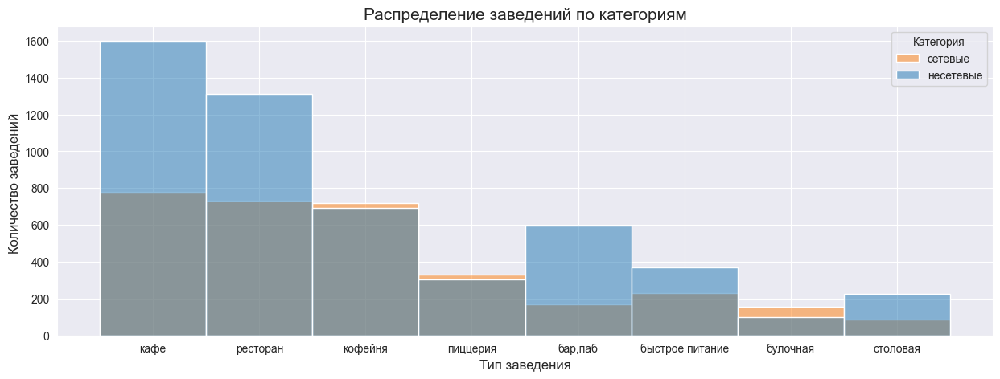

In [51]:
plt.figure(figsize=(15,5))
g = sns.histplot(x='category', data=df, hue='chain')
g.set_xlabel('Тип заведения',fontsize=12)
g.set_ylabel('Количество заведений ', fontsize=12)
g.set_title('Распределение заведений по категориям', fontsize=15)
plt.legend(['сетевые', 'несетевые'], title='Категория')
plt.show()

В Москве почти поровну кафе и ресторанов, булочные чаще бывают сетевыми а вот баров больше несетевых.  
Найдем топ-15 популярных сетей в Москве.

In [52]:
chain = df[df['chain'] == 1].groupby('name')['name'].agg('count').sort_values(ascending=False).iloc[:15]
chain.head

<bound method NDFrame.head of name
шоколадница                            120
домино'с пицца                          76
додо пицца                              74
one price coffee                        71
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
буханка                                 32
cofefest                                32
му-му                                   27
Name: name, dtype: int64>

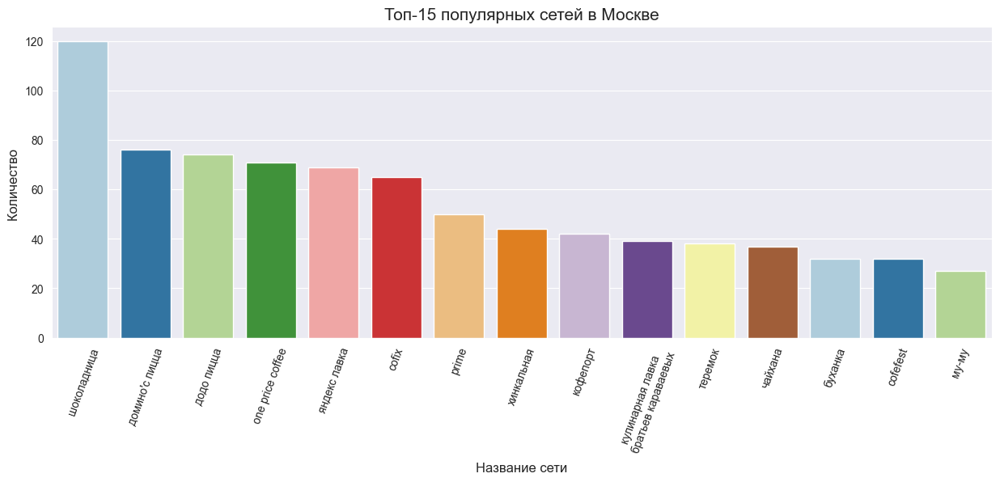

In [53]:
chain.rename(index={'кулинарная лавка братьев караваевых':'кулинарная лавка\n братьев караваевых'}, inplace= True )

plt.figure(figsize=(15,5))
g = sns.barplot(x=chain.index, y=chain.values,  palette='Paired')
g.set_xlabel('Название сети',fontsize=12)
g.set_ylabel('Количество ', fontsize=12)
g.set_title('Топ-15 популярных сетей в Москве', fontsize=15)
plt.xticks(rotation=70)
plt.show()

Все заведения, представленные на графике считаются бюджетными в своей категории

Посмотрим к каким категориям относятся эти заведения.

In [54]:
chain_category = list(chain.index)
chain_category_df = df.query('name in @chain_category')

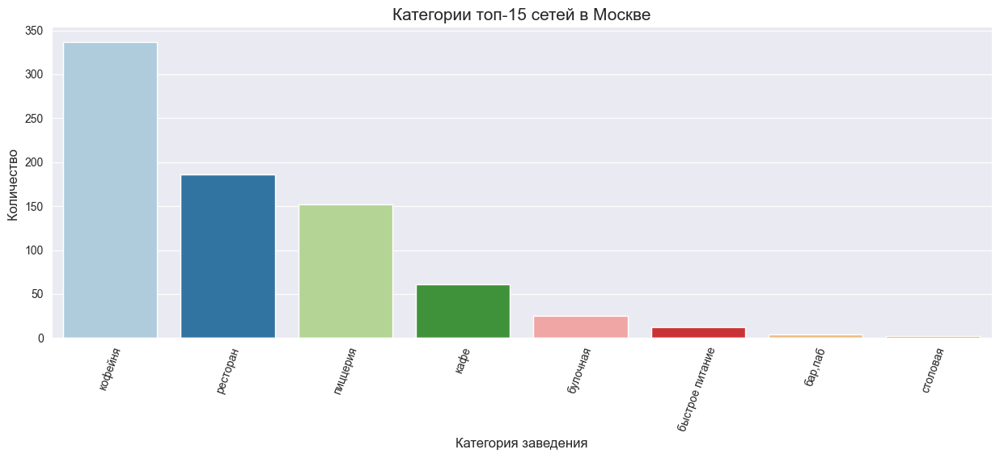

In [55]:
plt.figure(figsize=(15,5))
g = sns.countplot(x='category',  data = chain_category_df, palette='Paired', 
                  order = chain_category_df['category'].value_counts().index)
g.set_xlabel('Категория заведения',fontsize=12)
g.set_ylabel('Количество ', fontsize=12)
g.set_title('Категории топ-15 сетей в Москве', fontsize=15)
plt.xticks(rotation=70)
plt.show()

Из топ-15 сетей, большая часть относится к кофейням.

Посмотрим как распределены заведения по округам

In [56]:
district = df.groupby(['district','category'])['name'].agg({'count'}).sort_values(by='count',ascending=False).reset_index()
district['total'] = district.groupby('district')['count'].transform('sum')
district = district.sort_values(by=['total', 'count'], ascending=[False, False])
district

,district,category,count,total
0,Центральный административный округ,ресторан,670,2242
1,Центральный административный округ,кафе,464,2242
2,Центральный административный округ,кофейня,428,2242
3,Центральный административный округ,"бар,паб",364,2242
23,Центральный административный округ,пиццерия,113,2242
...,...,...,...,...
54,Северо-Западный административный округ,пиццерия,40,409
60,Северо-Западный административный округ,быстрое питание,30,409
67,Северо-Западный административный округ,"бар,паб",23,409
68,Северо-Западный административный округ,столовая,18,409


In [57]:
fig = px.bar(district, x='district', y='count', 
             width = 950, height = 550, color='category', text='count')
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title='Общее количество заведений и количество заведений каждой категории по округам',
    xaxis_title= '',
    yaxis_title='Количество заведений')
fig.update_traces( textfont_size = 12 ,  textangle = 0,  textposition = "outside" ,  cliponaxis = False ) 
fig.show()

In [58]:
# fig.show('png')

В датасете представлено 9 округов Москвы, больше всего заведений в `Центральный административный округ` .  
Он по количеству заведений более чем в два раза превосходит другие.  
Посмотрим на распределение средних рейтингов по категориям заведений

In [59]:
print(f" Средний рейтинг у заведений в Москве : {df['rating'].mean().round(2)}")

 Средний рейтинг у заведений в Москве : 4.23


In [60]:
rating =(df.groupby('category')['rating'].agg({'count', 'mean'})
     .sort_values(by='mean',ascending=False).reset_index())

(rating.style.background_gradient(cmap='Blues', subset='mean').set_precision(3)
     .set_caption('Средний рейтинг по категориям:')
     .set_table_styles([{'selector': 'caption', 'props': [('color', 'black'), ('font-size', '14px')]
                     }]))

,category,count,mean
0,"бар,паб",765,4.388
1,пиццерия,633,4.301
2,ресторан,2043,4.290
3,кофейня,1413,4.277
4,булочная,256,4.268
5,столовая,315,4.211
6,кафе,2378,4.124
7,быстрое питание,603,4.050


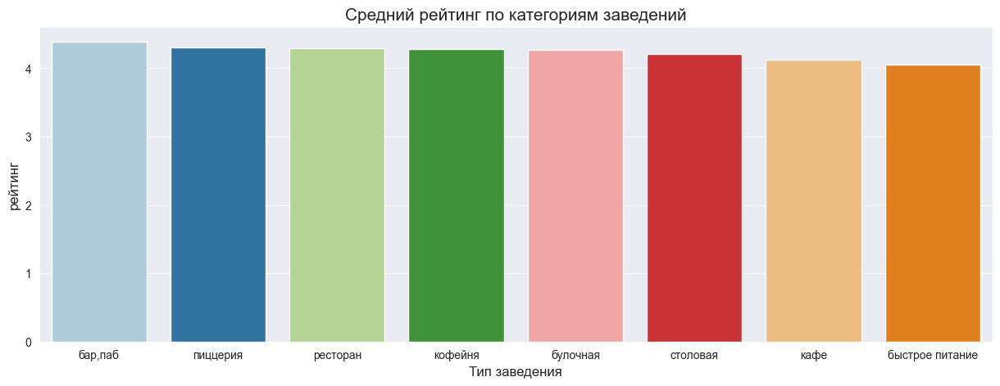

In [61]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x = 'category', 
                 y = 'mean', 
                 data = rating,
                 palette='Paired')
ax.set_xlabel('Тип заведения',fontsize=12)
ax.set_ylabel('рейтинг', fontsize=12)
ax.set_title('Средний рейтинг по категориям заведений', fontsize=15)
plt.show()

Средний рейтинг заведений в Москве не сильно отличается по категориям и составляет 4.23 бала.  
Посмотрим на средний рейтинг заведений по округам.

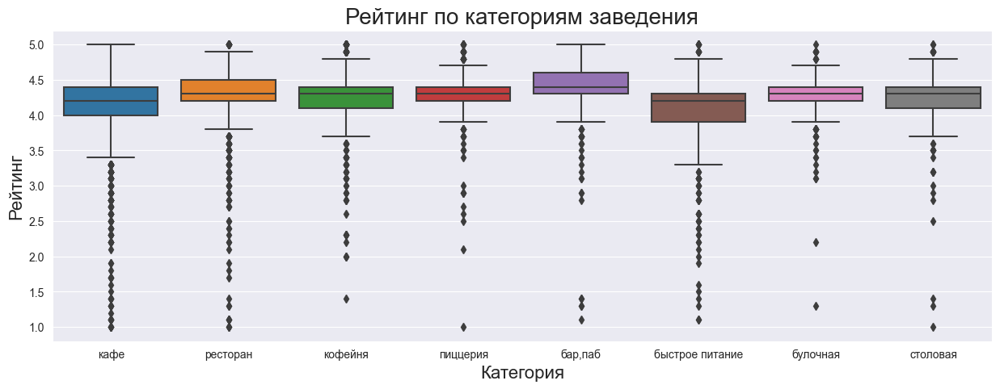

In [62]:
plt.figure(figsize=(15,5))

g = sns.boxplot(x='category', y='rating', data=df)
g.set_xlabel('Категория', fontsize=16)
g.set_ylabel('Рейтинг', fontsize=16)
g.set_title('Рейтинг по категориям заведения', fontsize=20)
plt.show()

Уберем выбросы и построим еше раз

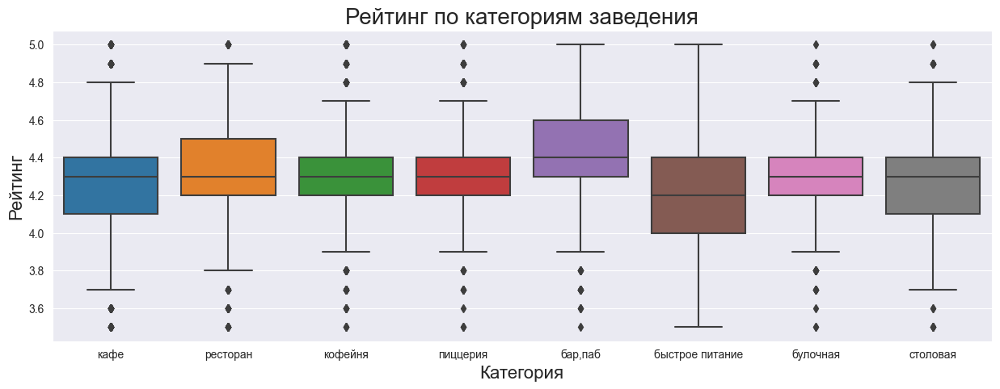

In [63]:
t  = df[df['rating'] > df['rating'].quantile(0.05)]
plt.figure(figsize=(15,5))

g = sns.boxplot(x='category', y='rating', data=t)
g.set_xlabel('Категория', fontsize=16)
g.set_ylabel('Рейтинг', fontsize=16)
g.set_title('Рейтинг по категориям заведения', fontsize=20)
plt.show()

Хорошо, что построили `ящик с усами` .  
Хоть показатели среднего рейтинга по категориям очень схожи, мы видим что у баров как правило средняя оценка выше, у кафе и ресторанов чаще всего встречаются минимальные оценки(выбросы).  
У заведений быстро питания самый большой размах `усов`(много значений сосредоточены в диапазоне 3,5-5)

In [64]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by= 'rating', ascending=False)
(rating_df.style.background_gradient(cmap='Blues', subset='rating').set_precision(3)
     .set_caption('Средний рейтинг по округам:')
     .set_table_styles([{'selector': 'caption', 'props': [('color', 'black'), ('font-size', '14px')]
                     }]))

,district,rating
5,Центральный административный округ,4.378
2,Северный административный округ,4.240
4,Северо-Западный административный округ,4.209
8,Южный административный округ,4.184
1,Западный административный округ,4.182
0,Восточный административный округ,4.174
7,Юго-Западный административный округ,4.173
3,Северо-Восточный административный округ,4.148
6,Юго-Восточный административный округ,4.101


Постройим фоновую картограмму (хороплет) со средним рейтингом заведений каждого округа. 

In [65]:
# загружаем JSON-файл с границами округов Москвы
with open('csv/admin_level_geomap.geojson', 'r', encoding='utf8') as f:
    geo_json = json.load(f)

In [66]:
# загружаем JSON-файл с границами округов Москвы
#state_geo = 'csv/admin_level_geomap.geojson'

In [67]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)


# выводим карту
m

На карте видно что заведения с наивысшим рейтингом находятся в центральном округе.  
Отобразим все заведения датасета на карте Москвы

In [68]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

loc = 'Расположение заведений на карте'
title_html = '''
             <h3 align="center" style="font-size:20px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(folium.Element(title_html))

# выводим карту
m

Найдием топ-15 улиц по количеству заведений

In [69]:
top_streets = df.groupby('street')['street'].agg({'count'}).reset_index().sort_values(by='count', ascending=False).iloc[0:16]
print(f" На 15 улицах находится: {top_streets['count'].sum()}, ниже список на какой улице, сколько заведений")
top_streets

 На 15 улицах находится: 1343, ниже список на какой улице, сколько заведений


,street,count
811,проспект мира,184
815,профсоюзная улица,122
808,проспект вернадского,108
536,ленинский проспект,107
534,ленинградский проспект,95
643,нет улицы,92
387,дмитровское шоссе,88
468,каширское шоссе,77
318,варшавское шоссе,75
535,ленинградское шоссе,69


Удалим из списка `нет улицы`.
Посмотрим в каких категориях представлены заведения.

In [70]:
top_streets = top_streets[top_streets['street'] != 'нет улицы']

In [71]:
top_streets = top_streets['street']

In [72]:
name_top_streets = df.query('street in @top_streets')

In [73]:
df_top_streets = name_top_streets.groupby(['street','category'])['name'].agg({'count'}).sort_values(by='count',ascending=False).reset_index()
df_top_streets['total'] = df_top_streets.groupby('street')['count'].transform('sum')
df_top_streets = df_top_streets.sort_values(by=['total', 'count'], ascending=[False, False])
df_top_streets['percent'] = np.round(df_top_streets['count'] / df_top_streets['total'] * 100, 2)
df_top_streets

,street,category,count,total,percent
0,проспект мира,кафе,53,184,28.80
1,проспект мира,ресторан,45,184,24.46
2,проспект мира,кофейня,36,184,19.57
18,проспект мира,быстрое питание,21,184,11.41
39,проспект мира,"бар,паб",12,184,6.52
...,...,...,...,...,...
58,пятницкая улица,кафе,7,48,14.58
61,пятницкая улица,кофейня,6,48,12.50
83,пятницкая улица,пиццерия,3,48,6.25
88,пятницкая улица,булочная,3,48,6.25


Для наглядности отрисуем на графике

In [74]:
fig = px.bar(df_top_streets, x='street', y='count', 
             width = 950, height = 550, color='category', text='count')
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title='Общее количество заведений и количество заведений каждой категории на 15 улицах Москвы',
    xaxis_title= '',
    yaxis_title='Количество заведений')
fig.update_traces( textfont_size = 12 ,  textangle = 0,  textposition = "outside" ,  cliponaxis = False ) 
fig.show() 

Больше всего заведений находится на проспекте Мира (184 шт).

Найдём улицы, на которых находится только один объект общепита. 

In [75]:
one_name_streets = df.groupby('street')['street'].agg({'count'}).reset_index().sort_values(by='count', ascending=True)
one_name_streets = one_name_streets[one_name_streets['count'] == 1]
one_name_streets = one_name_streets ['street']

In [76]:
min_streets = df.query('street in @one_name_streets')
print( f"По одному заведению на улице находится: {len(min_streets)} заведений.")

По одному заведению на улице находится: 430 заведений.


Посомтрим на распределение по категориям

In [77]:
df_min_streets = min_streets.groupby(['category'])['name'].agg({'count'}).sort_values(by='count',ascending=False).reset_index()
df_min_streets['percent'] = np.round(df_min_streets['count'] / len(min_streets) * 100, 2)
df_min_streets

,category,count,percent
0,кафе,148,34.42
1,ресторан,88,20.47
2,кофейня,77,17.91
3,"бар,паб",40,9.30
4,столовая,36,8.37
5,быстрое питание,18,4.19
6,пиццерия,14,3.26
7,булочная,9,2.09


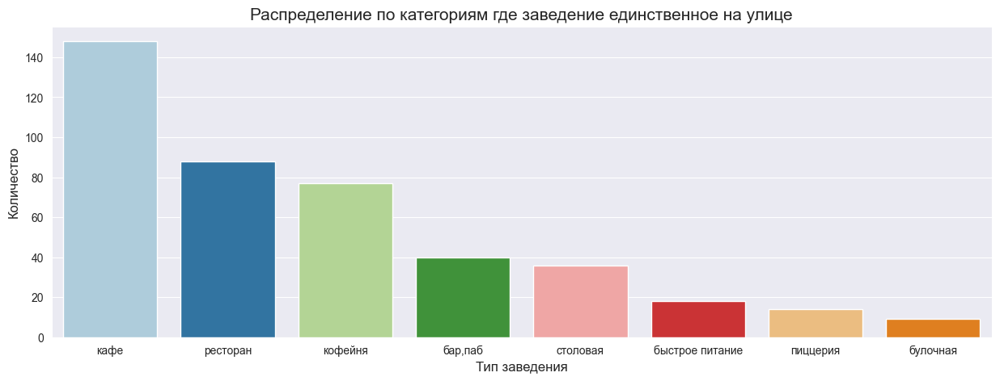

In [78]:
plt.figure(figsize=(15,5))
ax = sns.barplot(x = 'category', 
                 y = 'count', 
                 data = df_min_streets,
                 palette='Paired')
ax.set_xlabel('Тип заведения',fontsize=12)
ax.set_ylabel('Количество', fontsize=12)
ax.set_title('Распределение по категориям где заведение единственное на улице', fontsize=15)
plt.show()

Если на улице находится только одно заведение, то с вероятность в 35% это будет кафе.  
Посомтрим на  средний рейтинг эьих заведений и распределение по районам.

In [79]:
print(f"Средний рейтинг заведений: {min_streets['rating'].mean().round(2)}")

Средний рейтинг заведений: 4.25


In [80]:
t = min_streets.groupby('district')['name'].count().sort_values()
t

district
Юго-Западный административный округ         17
Северо-Западный административный округ      19
Юго-Восточный административный округ        33
Южный административный округ                37
Западный административный округ             38
Северный административный округ             48
Северо-Восточный административный округ     49
Восточный административный округ            54
Центральный административный округ         135
Name: name, dtype: int64

Представлены все категории заведений, больше всего заведений в Центральном административном округе.  
Давайте посмотрим на расположение заведений на карте Москвы 

In [ ]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
min_streets.apply(create_clusters, axis=1)

loc = 'Расположение заведений, которые единственные на улице'
title_html = '''
             <h3 align="center" style="font-size:20px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(folium.Element(title_html))

# выводим карту
m

Визуально заведения распределены равномерно, представлены все категории и имеют средний рейтинг такой же как и все заведения в Москве. Каких то особенностей в этим заведениях не выявлено.

In [ ]:
middle_avg_bill = (df.groupby('district')['middle_avg_bill'].agg({'median'}).reset_index()
                   .sort_values(by='median', ascending=False))
(middle_avg_bill.style.background_gradient(cmap='Blues', subset='median').set_precision(3)
     .set_caption('Медианная цена среднего чека по округам:')
     .set_table_styles([{'selector': 'caption', 'props': [('color', 'black'), ('font-size', '14px')]
                     }]))

Построим фоновую картограмму (хороплет) с медианной ценой среднего чека каждого округа.

In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=middle_avg_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)


# выводим карту
m

Самые дорогие заведения находятся в Западном и Центральном административный округе,  
самые дешевые в Юго-Восточном административном округе

**Вывод:** В Москве более 5000 заведений питания, большего всего ресторанов и кафе. Как правило заведения имеют до 100 посадочных мест.    
Порядка 40% заведений сетевые, почти поровну кафе и пиццерий по отношению сетевые/несетевые, а вот булочных больше сетевых.  
Есть улицы на которых представлено 180 заведений, но есть так же и где всего одно.  
Средний рейтинг заведений в Москве 4,2. Самые дорогие заведения расположены в Центральном и Западном округе.  
Центральный округ по количеству заведений более чем в два раза превосходит остальные районы.

### Детализируем исследование: открытие кофейни

Псомотрим сколько всего кофеен в Москве и в каких районах они представелны.

In [ ]:
coffee_pivot =  df[df['category'] == 'кофейня'].pivot_table(index='district', columns = 'chain' , values='name', aggfunc='count', margins=True).reset_index()
coffee_pivot.columns =  ['округ', 'несетевые', 'сетевые', 'всего']
coffee_pivot = coffee_pivot.sort_values(by='всего')
coffee_pivot

Для наглядности построим график

In [ ]:
coffee_pivot[['округ', 'несетевые', 'сетевые']][:-1].plot(x='округ', kind='bar', figsize=(15,5), color =['steelblue', 'cadetblue'])
plt.title( 'Распределение кафе по округам', fontsize=15)
plt.xlabel('Cобытие', fontsize=12), 
plt.ylabel('Количество', fontsize=12) 
plt.xticks(rotation=70)
plt.show()

Больше всего кофеен в Центральном районе, так же на графике можно заметить что в Юго-Восточном административном округе в два раза больше несетевых кафе, а в Западном наоборот сетевые представлены лучше.  
Проверим есть ли круглосуточные кофейни.

In [ ]:
coffee = df[df['category'] == 'кофейня'].copy()

In [ ]:
print(f"Круголсуточных заведений: {len(coffee[coffee['is_24/7'] == True])}")

Посмотрим сколько из них не являются сетевыми

In [ ]:
coffee[coffee['is_24/7'] == True].groupby('chain')['name'].agg({'count'}).reset_index()

Из 1413 кофеен всего 59 работают круглосуточно, из них только 9 несетевые.  
Давайте посмотрим на расположение всех кофеен в Москве

In [ ]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

loc = 'Расположение заведений на карте'
title_html = '''
             <h3 align="center" style="font-size:20px"><b>{}</b></h3>
             '''.format(loc)
m.get_root().html.add_child(folium.Element(title_html))

# выводим карту
m

In [ ]:
print(f"Средний рейтинг кофеен: {coffee['rating'].mean().round(2)}")

In [ ]:
coffee_rating = coffee.groupby('district')['rating'].agg({'count', 'mean'}).reset_index().sort_values(by='mean', ascending=False)
(coffee_rating.style.background_gradient(cmap='Blues', subset='mean').set_precision(3)
     .set_caption('Средний рейтинг кофеен по округам:')
     .set_table_styles([{'selector': 'caption', 'props': [('color', 'black'), ('font-size', '14px')]
                     }]))

Добавим в нашу табличку цену за чашку капучино

In [ ]:
t = coffee.groupby('district').agg({'rating':['count', 'mean'], 'middle_coffee_cup' : ['mean', 'median']}).reset_index()
t.columns = ['округ', 'колиечство', 'рейтинг', 'среднее', 'медиана']
t = t.sort_values(by='среднее', ascending=False)
t.style.background_gradient(cmap='Blues').set_precision(3)

In [ ]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)

sns.barplot(data=t , x = 'округ', y='среднее', palette='mako')
plt.title( 'Распределение цены по округам', fontsize=15)
plt.xlabel('', fontsize=12), 
plt.ylabel('цена', fontsize=12) 
plt.xticks(rotation=70)

plt.subplot(1, 2, 2)

sns.barplot(data=t , x = 'округ', y='рейтинг', palette='mako')
plt.title( 'Распределение рейтинга по округам', fontsize=15)
plt.xlabel('', fontsize=12), 
plt.ylabel('ркйтинг', fontsize=12) 
plt.xticks(rotation=70)


plt.show()

In [ ]:
print(f"Разница в средней цене чашки капучино по округам достигает: {(t['среднее'].min() / t['среднее'].max() * 100).round(2)}%")

**Вывод:**  В Москве 1400 кофеен, в соотношении 50/50 сетевые/несетевые. Больше всего в ЦАО (400шт) меньше всего в СЗАО.  
Круглосуточных заведений всего 59, средний рейтинг 4,28 что соответствует среднему рейтингу всех заведений в Москве.  
Средняя стоимость чашки капучино в зависимости от округа составляет 150-190руб.  

[Ссылка на презентацию](https://docs.google.com/presentation/d/1qeZX-wyHkIHCdzTa7i-_jStEz0xIi8cLqWg_mHpuTaE/edit?usp=sharing)

### Общий вывод

Для инвесторов из фонда «Shut Up and Take My Money» мы провели исследования рынка заведений общественного питания в Москве.
Нам доступны данные сервисов Яндекс Карты и Яндекс Бизнес на лето 2022г.
В результате исследования установили:
-	В Москве 8406 заведений общественного питания из них около 40% сетевые заведения.
-	Большего всего в Москве кафе, далее идут рестораны и кофейни, меньше всего булочных.  
-   Почти каждое 3-е кафе и каждый 5 ресторан и кофейня не указывают количество посадочных мест.
-	Есть улицы где находится более 100 заведений, но есть и где только одно.
-	Как правило заведения располагают до 100 посадочных мест, но есть  где количество мест превышает 800.
-	Булочные чаще бывают сетевыми, а вот баров больше несетевых.
-	Больше всего заведений в Центральный административный округ
-	Средний рейтинг заведений в Москве не сильно отличается по категориям и составляет 4.23 бала.
-	Средний чек находится в диапазоне 500-100 и зависит от округа. Самый дорогой ЦАО


Отдельное исследование по кофейням: 
-	1413 заведений их них 428 находится в ЦАО и всего 62 в СЗАО
-	720 сетевые, 693 несетевые
-	 ЮВО в два раза больше несетевых кофеен.
-	Круглосуточных заведений 59 из них только 9 несетевые
-	В среднем 97 посадочных мет, медианное значение 60
-	Средняя стоимость чашки капучино в зависимости от округа составляет 150-190руб


Как правило владельцы сетевого бизнеса точно знают где и какого формата заведение открыть.
Мы можем заметить, в ЗАО сеток в два раза больше чем обычных кофеен, при этом у этого округа самый низкий рейтинг и самый дорогой кофе.  
Инвесторам  из фонда `Shut Up and Take My Money` мы можем рекомендовать открыть кофейню в ЗАО.  Это должно быть помещение на 50-60 посадочных мест и стоимостью чашки капучино до 180 руб.  Обязательно стоит отслеживать рейтинг заведения и рассмотреть возможность круглосуточной работы.


**Чек-лист готовности проекта**

- [x] Замените названия столбцов на удобные для вас
- [x] Проверьте пропуски и типы данных. Откорректируйте, если нужно
- [x] Создайте столбец street с названиями улиц из столбца с адресом.
- [x] Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
- [x] Какие категории заведений представлены в данных?
- [x] Исследуйте количество посадочных мест в местах по категориям
- [x] Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
- [x] Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.
- [x] Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве.
- [x] Какие административные районы Москвы присутствуют в датасете?
- [x] Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
- [x] Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района
- [x] Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
- [x] Найдите топ-15 улиц по количеству заведений.
- [x] Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
- [x] Значения средних чеков заведений хранятся в столбце middle_avg_bill
- [x] Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных
- [x] Соберите наблюдения по вопросам выше в один общий вывод.
- [x] Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- [x] Есть ли круглосуточные кофейни?
- [x] Какие у кофеен рейтинги? Как они распределяются по районам?
- [x] На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
- [x] Общий вывод